Part 2 of the project. To be submitted by **08/11/2024 23:59**

-> Total = **50** pts

<p><img alt="Datasets" src="https://storage.googleapis.com/kaggle-media/competitions/home-credit/home_credit.png" align="left" hspace="10px" vspace="0px"></p>

<h1>Datasets</h1>

In [16]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.semi_supervised import LabelPropagation
from itertools import product
from sklearn.semi_supervised import LabelSpreading
import warnings
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm


In [3]:
### 1- Load the dataset "dataset"
### This dataset should be the app_train from the question 6.a of part 1 (Refer to correction if need be). You can include the previous notebook here, but we recommend instead you export it from previous notebook then load it here.
my_dataset = pd.read_csv('app_train_smote.csv')
my_dataset

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TARGET
0,100002,Cash loans,M,N,Y,0,202500.000000,4.065975e+05,24700.500000,3.510000e+05,...,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1
1,100003,Cash loans,F,N,N,0,270000.000000,1.293502e+06,35698.500000,1.129500e+06,...,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0
2,100004,Revolving loans,M,Y,Y,0,67500.000000,1.350000e+05,6750.000000,1.350000e+05,...,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0
3,100006,Cash loans,F,N,Y,0,135000.000000,3.126825e+05,29686.500000,2.970000e+05,...,0,0,0,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974,0
4,100007,Cash loans,M,N,Y,0,121500.000000,5.130000e+05,21865.500000,5.130000e+05,...,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565367,310260,Cash loans,F,N,Y,0,112500.000000,2.147468e+05,14720.930370,1.856808e+05,...,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,2.229349,1
565368,321235,Cash loans,M,Y,Y,0,160461.587250,6.751656e+05,44464.010148,6.256152e+05,...,0,0,0,0.001094,0.001197,0.005874,0.045707,0.045379,6.957294,1
565369,288091,Cash loans,F,N,Y,1,81542.806102,6.223270e+05,26374.740154,5.090743e+05,...,0,0,0,0.003996,0.004369,0.021446,0.166888,0.165689,1.937572,1
565370,379025,Cash loans,M,N,Y,0,207637.760571,3.682290e+05,28297.910763,3.375000e+05,...,0,0,0,0.002874,0.003142,0.015422,0.120012,0.119150,0.852742,1


# A

Processing the provided dataset  (review from past assignment, 7 pts)

**1.** Process the categorical features to be correctly handled. Use the most appropriate methods from sklearn (**2** pts)

**2.** Process the anomalies of the dataset (**1** pt)

**3.** Expand the 5 most important features (justify what 'important' means for you) using PolynomialFeatures (**2** pts). You may need to process missing values before.

**4.** Process the features using the best Scaler (**2** pts)

## A2

Process the anomalies of the dataset

In [4]:
numeric_features = my_dataset.select_dtypes(include=[int, float]).columns
q1 = my_dataset[numeric_features].quantile(0.25)
q3 = my_dataset[numeric_features].quantile(0.75)
iqr = q3 - q1
low = q1 - 1.5 * iqr
high = q3 + 1.5 * iqr

outliers = my_dataset[((my_dataset[numeric_features] < low) | (my_dataset[numeric_features] > high)).any(axis=1)]
outliers.shape

(519088, 72)

In [5]:
my_dataset = my_dataset[~((my_dataset[numeric_features] < low) | (my_dataset[numeric_features] > high)).any(axis=1)]
my_dataset

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TARGET
13,100017,Cash loans,M,Y,N,1,225000.000000,9.184680e+05,28966.500000,6.975000e+05,...,0,0,0,0.0,0.0,0.0,0.000000,0.0,1.000000,0
63,100075,Cash loans,F,N,N,0,112500.000000,9.594000e+04,10462.500000,9.000000e+04,...,0,0,0,0.0,0.0,0.0,0.000000,0.0,5.000000,0
66,100078,Cash loans,F,Y,Y,0,180000.000000,1.035000e+06,43983.000000,1.035000e+06,...,0,0,0,0.0,0.0,0.0,0.000000,0.0,3.000000,0
93,100111,Cash loans,F,Y,N,1,112500.000000,8.625600e+05,27954.000000,7.200000e+05,...,0,0,0,0.0,0.0,0.0,0.000000,0.0,0.000000,0
128,100149,Cash loans,M,Y,N,0,171000.000000,5.395905e+05,26374.500000,4.455000e+05,...,0,0,0,0.0,0.0,0.0,0.000000,0.0,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565330,403595,Cash loans,M,N,N,0,269296.861405,5.023415e+05,39817.265388,4.543594e+05,...,0,0,0,0.0,0.0,0.0,0.031251,0.0,2.000000,1
565339,438358,Cash loans,M,N,Y,0,140875.267195,1.041229e+06,33369.095612,9.217254e+05,...,0,0,0,0.0,0.0,0.0,0.000000,0.0,3.000000,1
565340,296870,Cash loans,M,Y,Y,1,180000.000000,2.869331e+05,18736.221390,2.317912e+05,...,0,0,0,0.0,0.0,0.0,0.377287,0.0,5.000000,1
565357,271356,Cash loans,F,N,Y,0,232345.582173,9.000000e+05,40056.225563,9.000000e+05,...,0,0,0,0.0,0.0,0.0,0.000000,0.0,0.000000,1


## A3

Expand the 5 most important features (justify what 'important' means for you) using PolynomialFeatures (**2** pts). You may need to process missing values before.


Since we should use `PolynomialFeatures`, we will search for the important features among the numerical features.

In [6]:
feature_importance = (
    RandomForestClassifier(n_estimators=100, random_state=42)
    .fit(
        (numerical_dataset := my_dataset.drop("TARGET", axis=1).select_dtypes("number")),
        my_dataset["TARGET"],
    )
    .feature_importances_
)
most_important_features = numerical_dataset.columns[np.argsort(feature_importance)[:-5:-1]]
most_important_features

Index(['EXT_SOURCE_3', 'EXT_SOURCE_2', 'CNT_FAM_MEMBERS',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

**What 'important' means for me:**
One easy way to define the importance of a feature is to use the feature importance attribute of a model (like `RandomForest` or `XGBoost`). Or we can use the correlation of the feature with the target variable.

In [7]:
from sklearn.preprocessing import PolynomialFeatures


expanded_df = pd.concat(
    [
        my_dataset.drop(columns=most_important_features).reset_index(drop=True),
        pd.DataFrame(
            (pf := PolynomialFeatures(degree=2)).fit_transform(
                numerical_dataset[most_important_features]
            ),
            columns=pf.get_feature_names_out(),
        ),
    ],
    axis=1,
)
expanded_df

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,EXT_SOURCE_3^2,EXT_SOURCE_3 EXT_SOURCE_2,EXT_SOURCE_3 CNT_FAM_MEMBERS,EXT_SOURCE_3 AMT_REQ_CREDIT_BUREAU_YEAR,EXT_SOURCE_2^2,EXT_SOURCE_2 CNT_FAM_MEMBERS,EXT_SOURCE_2 AMT_REQ_CREDIT_BUREAU_YEAR,CNT_FAM_MEMBERS^2,CNT_FAM_MEMBERS AMT_REQ_CREDIT_BUREAU_YEAR,AMT_REQ_CREDIT_BUREAU_YEAR^2
0,100017,Cash loans,M,Y,N,1,225000.000000,9.184680e+05,28966.500000,6.975000e+05,...,0.593034,0.436567,2.310261,0.770087,0.321383,1.700720,0.566907,9.000000,3.000000,1.000000
1,100075,Cash loans,F,N,N,0,112500.000000,9.594000e+04,10462.500000,9.000000e+04,...,0.242123,0.326996,0.492060,2.460300,0.441619,0.664544,3.322720,1.000000,5.000000,25.000000
2,100078,Cash loans,F,Y,Y,0,180000.000000,1.035000e+06,43983.000000,1.035000e+06,...,0.184405,0.222128,0.858847,1.288271,0.267569,1.034541,1.551811,4.000000,6.000000,9.000000
3,100111,Cash loans,F,Y,N,1,112500.000000,8.625600e+05,27954.000000,7.200000e+05,...,0.052388,0.139299,0.686650,0.000000,0.370399,1.825812,0.000000,9.000000,0.000000,0.000000
4,100149,Cash loans,M,Y,N,0,171000.000000,5.395905e+05,26374.500000,4.455000e+05,...,0.008466,0.015133,0.184026,0.000000,0.027048,0.328926,0.000000,4.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46279,403595,Cash loans,M,N,N,0,269296.861405,5.023415e+05,39817.265388,4.543594e+05,...,0.069590,0.139280,0.535841,0.527597,0.278761,1.072456,1.055956,4.125979,4.062501,4.000000
46280,438358,Cash loans,M,N,Y,0,140875.267195,1.041229e+06,33369.095612,9.217254e+05,...,0.179956,0.293162,0.645754,1.272635,0.477584,1.051985,2.073223,2.317233,4.566738,9.000000
46281,296870,Cash loans,M,Y,Y,1,180000.000000,2.869331e+05,18736.221390,2.317912e+05,...,0.025379,0.049935,0.417823,0.796547,0.098249,0.822080,1.567231,6.878624,13.113565,25.000000
46282,271356,Cash loans,F,N,Y,0,232345.582173,9.000000e+05,40056.225563,9.000000e+05,...,0.085616,0.145546,0.718596,0.000000,0.247427,1.221607,0.000000,6.031360,0.000000,0.000000


### Features importance with Random Forest


#B/ Basic Machine Learning (8 pts)

In the following, you will use a split of my_dataset between train and validation. The metrics will be evaluated on the validation set.

**5.** Following the lecture and Random Forest example compare the performance of a Random Forest Classifier and a Logistic Regression Classifier:

**5.1** Scale the features (only for Logistic Regression) (**1** pt)

**5.2** Train a Logistic Regression with C = 0.0001  (**1** pt)

**5.3** Evaluate the performance metrics of the Logistic Regression. Which ones are relevant and which are not? (**2** pts)

**5.4** Train a Random Forest Classifier with 100 estimators and the default max_depth (**2** pts)

**5.5** Evaluate the performance metrics of the Random Forest. Which ones are relevant and which are not? (**2** pts)

# B

# B5

Let's read the labeled dataset (which are the categorical features basically) from `app_train_encoded.csv` file, and combine it with the numerical features from `my_dataset`.

In [8]:
from sklearn.preprocessing import OneHotEncoder


max_class_count = 5
app_train_summarized = my_dataset.copy()
assert app_train_summarized.isna().sum().sum() == 0, "There are missing data in the train dataset"

ordered_cats = ["NAME_EDUCATION_TYPE", "WEEKDAY_APPR_PROCESS_START"]
mapper = {}
vectorized_cols = app_train_summarized.select_dtypes(include="object").columns
new_cat = "Other"

for col in ordered_cats:
    mapper[col] = {
        cat: i for i, cat in enumerate(app_train_summarized[col].unique())
    }
    app_train_summarized[col] = app_train_summarized[col].map(mapper[col])
    if col in vectorized_cols:
        print(f"The column {col} is in the vectorized columns")
        vectorized_cols = vectorized_cols.drop(col)

assert app_train_summarized.isna().sum().sum() == 0, "There are missing data in the train dataset"


encoder = OneHotEncoder(
    drop="first",
    max_categories=max_class_count,
    min_frequency=0.1,
    handle_unknown="infrequent_if_exist",
    sparse_output=False,
).fit(app_train_summarized[vectorized_cols])
app_train_encoded_arr = encoder.transform(app_train_summarized[vectorized_cols])
app_train_encoded = pd.concat(
    [
        (t:=pd.DataFrame(app_train_encoded_arr, columns=encoder.get_feature_names_out())).reset_index(drop=True),
        app_train_summarized.select_dtypes("number").reset_index(drop=True),
        app_train_summarized[ordered_cats].reset_index(drop=True),
    ],
    axis=1,
)
# Remove constant columns
app_train_encoded = app_train_encoded.loc[:, (app_train_encoded != app_train_encoded.iloc[0]).any()]
app_train_encoded

The column NAME_EDUCATION_TYPE is in the vectorized columns
The column WEEKDAY_APPR_PROCESS_START is in the vectorized columns


,NAME_CONTRACT_TYPE_infrequent_sklearn,CODE_GENDER_M,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_Y,NAME_TYPE_SUITE_infrequent_sklearn,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_infrequent_sklearn,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_infrequent_sklearn,NAME_HOUSING_TYPE_infrequent_sklearn,...,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TARGET,NAME_EDUCATION_TYPE,WEEKDAY_APPR_PROCESS_START
0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.770087,0.000000,0.000000,-4.000000,0.000000,0.0,1.000000,0,0,0
1,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,...,0.492060,0.000000,0.000000,-280.000000,0.000000,0.0,5.000000,0,1,1
2,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.429424,0.000000,0.000000,-1594.000000,0.000000,0.0,3.000000,0,1,2
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.228883,1.000000,1.000000,-1234.000000,0.000000,0.0,0.000000,0,0,1
4,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.092013,1.000000,1.000000,-395.000000,0.000000,0.0,0.000000,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46279,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.263799,0.000000,0.000000,-1736.936687,0.031251,0.0,2.000000,1,1,4
46280,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.424212,3.477754,3.477754,-883.853897,0.000000,0.0,3.000000,1,0,1
46281,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.159309,0.000000,0.000000,-364.287126,0.377287,0.0,5.000000,1,0,5
46282,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.292602,2.088234,2.088234,-1972.823470,0.000000,0.0,0.000000,1,0,2


## Train Validation Split

In [9]:
sampled_df = app_train_encoded.sample(frac=0.3, random_state=1376)
print(sampled_df.shape)
x_train, x_valid, y_train, y_valid = train_test_split(
    sampled_df.drop(columns="TARGET"),
    sampled_df["TARGET"],
    test_size=0.2,
    random_state=1376,
)

assert x_train.shape[0] == y_train.shape[0], "The number of rows in x_train and y_train should be the same"
assert x_valid.shape[0] == y_valid.shape[0], "The number of rows in x_valid and y_valid should be the same"
assert x_train.shape[1] == x_valid.shape[1], "The number of columns in x_train and x_valid should be the same"


x_train

(13885, 38)


,NAME_CONTRACT_TYPE_infrequent_sklearn,CODE_GENDER_M,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_Y,NAME_TYPE_SUITE_infrequent_sklearn,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_infrequent_sklearn,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_infrequent_sklearn,NAME_HOUSING_TYPE_infrequent_sklearn,...,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_EDUCATION_TYPE,WEEKDAY_APPR_PROCESS_START
42900,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.181117,0.728392,0.000000,0.000000,-901.948002,0.000000,0.628867,3.371133,0,4
21383,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.487140,0.556369,0.655631,0.655631,-449.817586,0.163908,0.000000,0.000000,0,0
17792,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.732212,0.510853,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0,2
28066,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.633011,0.354229,2.031871,2.031871,-256.173134,0.000000,0.507968,0.000000,1,4
2532,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.257184,0.622922,1.000000,0.000000,-1126.000000,0.000000,0.000000,3.000000,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2319,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.533388,0.452534,3.000000,3.000000,-880.000000,0.000000,0.000000,3.000000,0,6
30368,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.596892,0.391846,0.000000,0.000000,-906.076128,0.000000,0.000000,0.000000,0,0
29932,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.662081,0.273774,3.320175,3.320175,-416.345907,0.000000,0.000000,1.577068,0,2
23214,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.229295,0.222965,2.189234,2.189234,-724.985182,0.000000,0.000000,0.452692,0,3


In [11]:
from sklearn.linear_model import LogisticRegression

rf_model = RandomForestClassifier(n_estimators=100, random_state=1376).fit(x_train, y_train)
print("Random Forest model score: ", rf_model.score(x_valid, y_valid))

x_train_norm = (x_train - x_train.mean()) / x_train.std()
x_valid_norm = (x_valid - x_train.mean()) / x_train.std()
# note: we are using the mean and std of the training set to normalize the validation set to avoid data leakage
lr_model = LogisticRegression(C=0.0001, random_state=1376).fit(x_train_norm, y_train)
print("Logistic Regression model score: ", lr_model.score(x_valid_norm, y_valid))

Random Forest model score:  0.9175369103348938
Logistic Regression model score:  0.7457688152682751


In [12]:
# **5.4** Train a Random Forest Classifier with 100 estimators and the default max_depth (**2** pts)

rf_model = RandomForestClassifier(n_estimators=100, random_state=1376).fit(x_train, y_train)

In [13]:
from matplotlib import style
from matplotlib.pylab import f
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import rich

y_pred_rf = rf_model.predict(x_valid)
y_pred_rf_proba = rf_model.predict_proba(x_valid)[:, 1]

y_pred_lr = lr_model.predict(x_valid_norm)
y_pred_lr_proba = lr_model.predict_proba(x_valid_norm)[:, 1]


console = rich.get_console()
table = rich.table.Table(title="Model Performance")
table.add_column("Model")
table.add_column("Accuracy")
table.add_column("Precision")
table.add_column("Recall")
table.add_column("F1")
table.add_column("AUC")
table.add_row(
    "Random Forest",
    f"{accuracy_score(y_valid, y_pred_rf):2.3f}",
    f"{precision_score(y_valid, y_pred_rf):2.3f}",
    f"{recall_score(y_valid, y_pred_rf):2.3f}",
    f"{f1_score(y_valid, y_pred_rf):2.3f}",
    f"{roc_auc_score(y_valid, y_pred_rf_proba):2.3f}",
    style="bold green",
)
table.add_row(
    "Logistic Regression",
    f"{accuracy_score(y_valid, y_pred_lr):2.3f}",
    f"{precision_score(y_valid, y_pred_lr):2.3f}",
    f"{recall_score(y_valid, y_pred_lr):2.3f}",
    f"{f1_score(y_valid, y_pred_lr):2.3f}",
    f"{roc_auc_score(y_valid, y_pred_lr_proba):2.3f}",
    style="bold blue",
)

console.print(table)

                           Model Performance                           
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃ Model               ┃ Accuracy ┃ Precision ┃ Recall ┃ F1    ┃ AUC   ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ Random Forest       │ 0.918    │ 0.933     │ 0.938  │ 0.936 │ 0.970 │
│ Logistic Regression │ 0.746    │ 0.719     │ 0.988  │ 0.832 │ 0.897 │
└─────────────────────┴──────────┴───────────┴────────┴───────┴───────┘

#C/ Machine Learning Hyper-parameter optimization (10 pts)

**6.** Use a grid-search to find a better combination C value and "class_weight" value for the previous Logistic Regression Model (you can do a search manually with a loop or use Scikit-learn grid search features) (**2** pts)

**7.1** Use a random search to find a better combination C value and "class_weight" value for the previous Logistic Regression Model.  (you can do a search manually with a loop or use Scikit-learn grid search features) (**2** pts)

**7.2** How many random iterations are needed to find performances as good as your previous grid search? (**2** pts)


**8.1** Plot how the performance metric selected in 5.5 changes when changing the number of estimators? When changing the depth of the trees (max 10)? (**2** pts)

**8.2** What are the optimal values of these parameters (optimized together)? (**2** pts)

In [14]:
# **6.** Use a grid-search to find a better combination C value and "class_weight" value for the previous Logistic Regression Model (you can do a search manually with a loop or use Scikit-learn grid search features) (**2** pts)

grid_search_params = {}
for c in [0.001, 0.01, 0.1, 1, 10, 100]:
    for class_weight in [None, "balanced"]:
        grid_search_params[(c, class_weight)] = LogisticRegression(C=c, class_weight=class_weight, random_state=1376).fit(x_train_norm, y_train).score(x_valid_norm, y_valid)

best_params = max(grid_search_params, key=grid_search_params.get)
print(f"The best parameters are: {best_params} with a score of {grid_search_params[best_params]}")
      

The best parameters are: (10, 'balanced') with a score of 0.8476773496579042


In [15]:
# **7.1** Use a random search to find a better combination C value and "class_weight" value for the previous Logistic Regression Model.  (you can do a search manually with a loop or use Scikit-learn grid search features) (**2** pts)

import random


random_search_params = {}
for _ in range(100):
    c = np.random.uniform(0.001, 100, 1)[0]
    class_weight = random.choice([None, "balanced"])
    random_search_params[(c, class_weight)] = LogisticRegression(C=c, class_weight=class_weight, random_state=1376).fit(x_train_norm, y_train).score(x_valid_norm, y_valid)

best_params = max(random_search_params, key=random_search_params.get)
print(f"The best parameters are: {best_params} with a score of {random_search_params[best_params]}")

The best parameters are: (10.737998050459177, 'balanced') with a score of 0.8476773496579042


**7.2** How many random iterations are needed to find performances as good as your previous grid search? (**2** pts)
> Almost 100 or 50 iterations are enough to find the best parameters.

In [ ]:
# **8.1** Plot how the performance metric selected in 5.5 changes when changing the number of estimators? When changing the depth of the trees (max 10)? (**2** pts)


n_estimators = [10, 100, 300, 500]
max_depth = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
scores = np.zeros((len(n_estimators), len(max_depth)))

for ni, n in enumerate(tqdm(n_estimators)):
    for di, d in enumerate(tqdm(max_depth, leave=False, desc=f"n_estimators={n}")):
        model = RandomForestClassifier(n_estimators=n, max_depth=d, random_state=1376).fit(x_train, y_train)
        scores[ni, di] = model.score(x_valid, y_valid)


  0%|          | 0/4 [00:00<?, ?it/s]

n_estimators=10:   0%|          | 0/10 [00:00<?, ?it/s]

n_estimators=100:   0%|          | 0/10 [00:00<?, ?it/s]

n_estimators=300:   0%|          | 0/10 [00:00<?, ?it/s]

n_estimators=500:   0%|          | 0/10 [00:00<?, ?it/s]

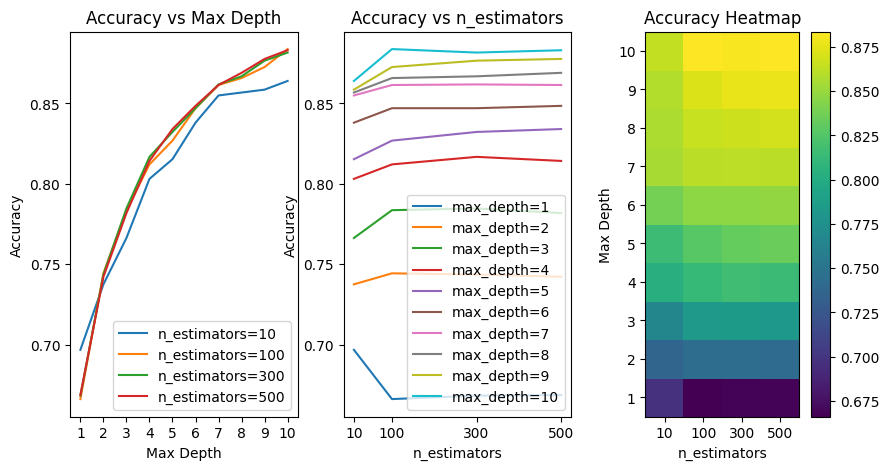

In [17]:

plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
for i, n in enumerate(n_estimators):
    plt.plot(max_depth, scores[i, :], label=f"n_estimators={n}")
plt.xticks(max_depth)
plt.xlabel("Max Depth")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Max Depth")
plt.legend()

plt.subplot(1, 3, 2)
for i, d in enumerate(max_depth):
    plt.plot(n_estimators, scores[:, i], label=f"max_depth={d}")
plt.xticks(n_estimators)
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.title("Accuracy vs n_estimators")
plt.legend()

plt.subplot(1, 3, 3)
plt.imshow(scores.T, cmap="viridis", origin="lower")
plt.yticks(np.arange(len(max_depth)), max_depth)
plt.xticks(np.arange(len(n_estimators)), n_estimators)
plt.colorbar()
plt.ylabel("Max Depth")
plt.xlabel("n_estimators")
plt.title("Accuracy Heatmap")
plt.show()

    

In [18]:
# **8.2** What are the optimal values of these parameters (optimized together)? (**2** pts)

arg_max_n_estimators, arg_max_max_depth = np.unravel_index(scores.argmax(), scores.shape)
print(f"The optimal values are n_estimators={n_estimators[arg_max_n_estimators]} and max_depth={max_depth[arg_max_max_depth]} with a score of {scores[arg_max_n_estimators, arg_max_max_depth]}")

The optimal values are n_estimators=100 and max_depth=10 with a score of 0.8836874324810947


#D/ Post Machine Learning Feature inteprepretation (5 pts)

**9.1** Get the features importance of the Optimal Random Forest classifier (obtained in 8) (**2** pts)

**9.2** Are they the features that are the most correlated with the target? (**1** pt)

**10.** Compare the tree structure obtained with visualization (using export_graphviz for instance) of the first tree of your random forest and the last tree of your random forest. How can you explain the differences?  (**2** pts)


<Axes: title={'center': 'Feature Importance'}, ylabel='Importance'>

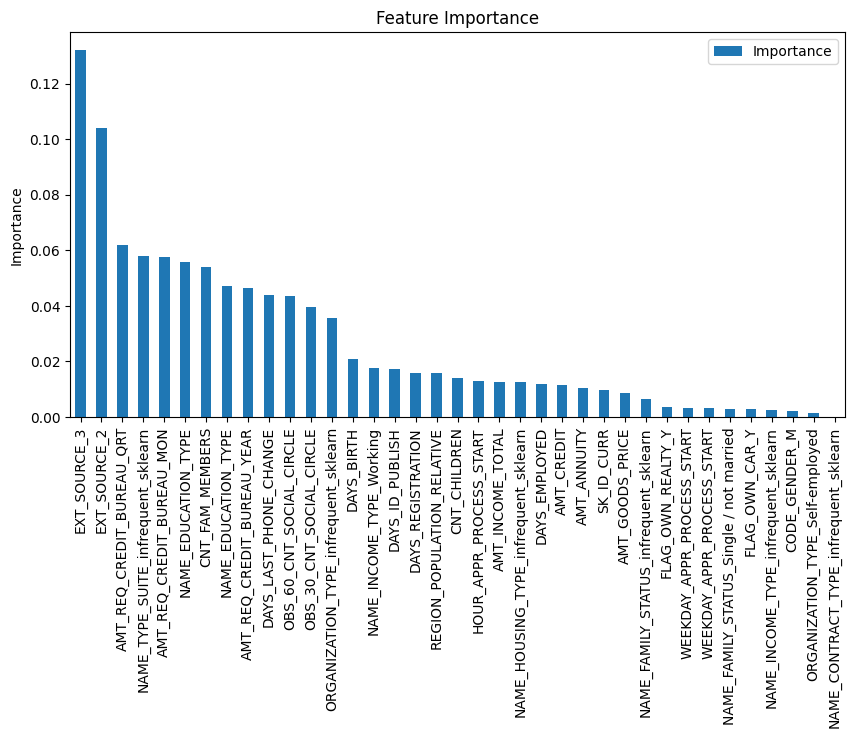

In [19]:
# **9.1** Get the features importance of the Optimal Random Forest classifier (obtained in 8) (**2** pts)

best_rf_model = RandomForestClassifier(
    n_estimators=n_estimators[arg_max_n_estimators],
    max_depth=max_depth[arg_max_max_depth],
    random_state=1376,
).fit(x_train, y_train)
feature_importance = best_rf_model.feature_importances_
feature_importance_df = pd.DataFrame(
    feature_importance,
    index=x_train.columns,
    columns=["Importance"],
).sort_values("Importance", ascending=False)
feature_importance_df.plot(kind="bar", figsize=(10, 5), title="Feature Importance", ylabel="Importance")


<Axes: title={'center': 'Feature Importance vs Correlation'}, ylabel='Importance/Correlation'>

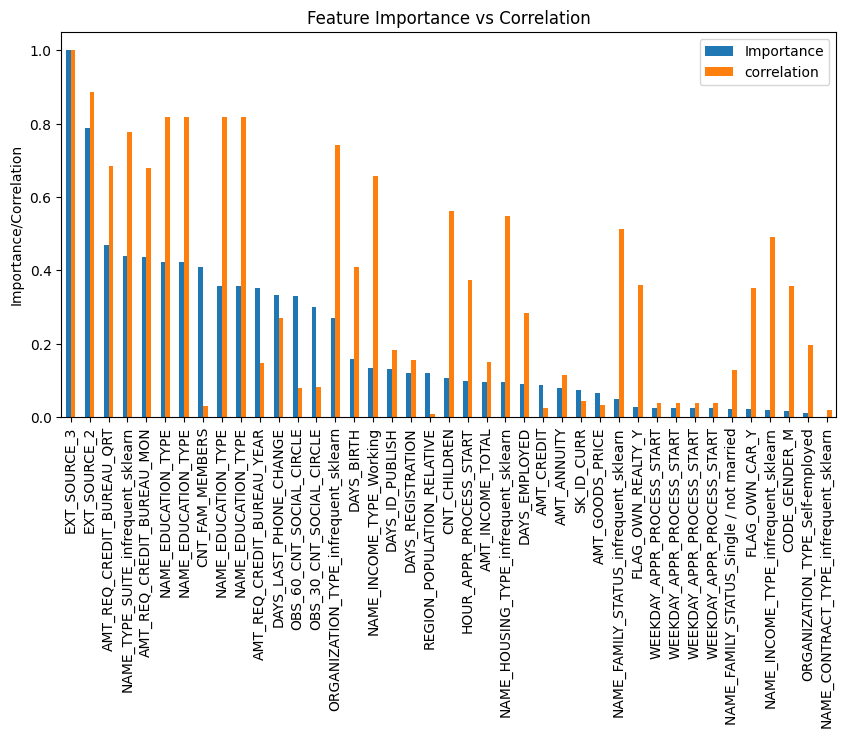

In [20]:
# **9.2** Are they the features that are the most correlated with the target? (**1** pt)

correlation = app_train_encoded.corr()["TARGET"].abs().sort_values(ascending=False).to_frame("correlation").drop("TARGET")
t = feature_importance_df.join(correlation, how="inner")
t = t / t.max()
t.plot(kind="bar", figsize=(10, 5), title="Feature Importance vs Correlation", ylabel="Importance/Correlation")

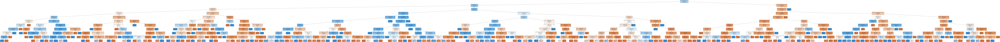

In [21]:
# **10.** Compare the tree structure obtained with visualization (using export_graphviz for instance) of the first tree of your random forest and the last tree of your random forest. How can you explain the differences?  (**2** pts)

from sklearn.tree import export_graphviz
import pydot
from IPython.display import Image

for i, tree in enumerate(best_rf_model.estimators_):
    if i == 0:
        export_graphviz(
            tree,
            out_file="tree_first.dot",
            feature_names=x_train.columns,
            class_names=["0", "1"],
            rounded=True,
            filled=True,
        )
        (graph := pydot.graph_from_dot_file("tree_first.dot"))[0].write_png("tree_first.png")
        break

for i, tree in enumerate(best_rf_model.estimators_):
    if i == len(best_rf_model.estimators_) - 1:
        export_graphviz(
            tree,
            out_file="tree_last.dot",
            feature_names=x_train.columns,
            class_names=["0", "1"],
            rounded=True,
            filled=True,
        )
        (graph := pydot.graph_from_dot_file("tree_last.dot"))[0].write_png("tree_last.png")
        break

Image("tree_first.png")

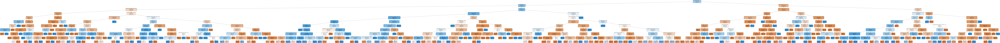

In [22]:
Image("tree_last.png")

#E/ Evasion attacks (12pts)

**11.** Implement the Algorithm 2 from the research paper in https://arxiv.org/pdf/1605.07277.pdf

Section 6.5 of the research paper describes the intuition of the algorithm and the different parameters (**5** pts).

PS: the whole paper gives you a good understand of adversarial attacks and is a recommended reading

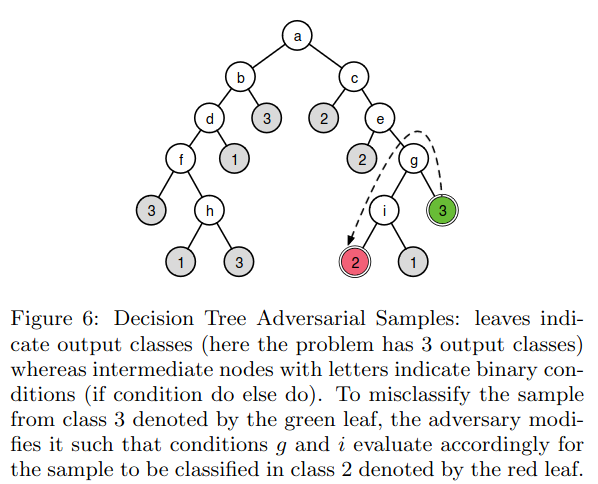

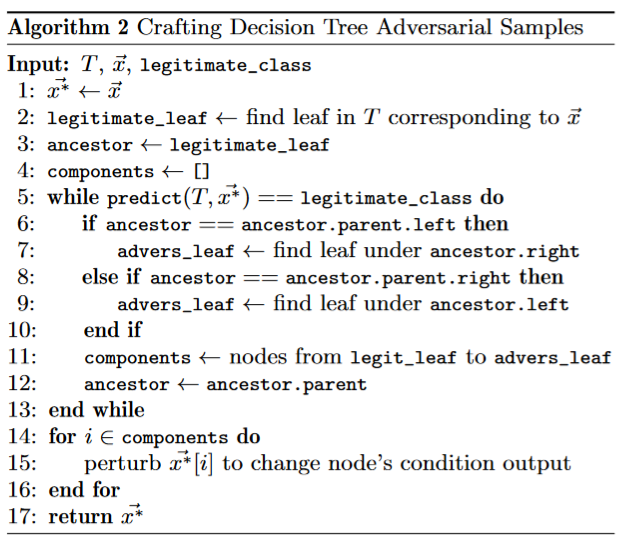

In [23]:
import numpy as np
from sklearn.tree import DecisionTreeClassifier

# Function to find the leaf node corresponding to an input sample
def find_leaf_node(tree, sample):
    node = 0  # Start at the root
    while tree.tree_.children_left[node] != -1:  # Check if it's not a leaf node
        feature = tree.tree_.feature[node]
        threshold = tree.tree_.threshold[node]
        if sample[feature] <= threshold:
            node = tree.tree_.children_left[node]
        else:
            node = tree.tree_.children_right[node]
    return node

# Function to find the parent of a given node
def find_parent(tree, node_id):
    for i in range(tree.tree_.node_count):
        if (tree.tree_.children_left[i] == node_id) or (tree.tree_.children_right[i] == node_id):
            return i
    return None

# Function to craft adversarial samples
def craft_adversarial_sample(tree, x, legitimate_class, max_iterations=1000):
    x_adv = x.copy()
    legitimate_leaf = find_leaf_node(tree, x)
    ancestor = legitimate_leaf
    components = []
    iteration = 0

    # While the sample is still classified as the legitimate class
    while tree.predict([x_adv])[0] == legitimate_class and iteration < max_iterations:
        parent = find_parent(tree, ancestor)
        if parent is None:  # If there's no parent, we've reached the root
            break

        if ancestor == tree.tree_.children_left[parent]:
            advers_leaf = tree.tree_.children_right[parent]
        else:
            advers_leaf = tree.tree_.children_left[parent]
        
        components.extend([ancestor])
        ancestor = parent
        iteration += 1

    # Perturb features along the path to change the output
    for i in components:
        feature = tree.tree_.feature[i]
        if feature != -2:  # Check if it's a valid split feature
            threshold = tree.tree_.threshold[i]
            if x_adv[feature] <= threshold:
                x_adv[feature] = threshold + 1e-4  # Small perturbation to switch side
            else:
                x_adv[feature] = threshold - 1e-4

    return x_adv

# Sample usage
X_train_tmp = np.array([[2, 3], [1, 5], [4, 6], [7, 8]])
y_train_tmp = np.array([0, 0, 1, 1])

# Train a simple decision tree classifier
clf = DecisionTreeClassifier(max_depth=3)
clf.fit(X_train_tmp, y_train_tmp)

# Create an adversarial example from a legitimate sample
x_legit = np.array([2, 3])
legitimate_class = clf.predict([x_legit])[0]
adversarial_sample = craft_adversarial_sample(clf, x_legit, legitimate_class)

print("Original sample:", x_legit)
print("Adversarial sample:", adversarial_sample)


Original sample: [2 3]
Adversarial sample: [2 3]


**12.1** Either using the attack you implemented in question 11. or using the library Adversarial Robustness Toolbox (https://github.com/Trusted-AI/adversarial-robustness-toolbox/), generate a Decision Tree Attack on the validation set on the first tree of the random forest (cf question 10). (**5** pts).

## Random Forest Attack

In [24]:
from sklearn.ensemble import RandomForestClassifier
from art.attacks.evasion import HopSkipJump
from art.estimators.classification import SklearnClassifier
import numpy as np

# Create synthetic training data
X_train_tmp = np.array([[0, 0], [1, 1], [0, 1], [1, 0]])
y_train_tmp = np.array([0, 1, 1, 0])

# Train a random forest classifier
model = RandomForestClassifier(n_estimators=10)
model.fit(X_train_tmp, y_train_tmp)

# Wrap the model with ART's SklearnClassifier
classifier = SklearnClassifier(model=model)

# Create an instance of the HopSkipJump attack
attack = HopSkipJump(classifier=classifier)

# Generate adversarial examples
X_test = np.array([[0.1, 0.1], [0.9, 0.9]])  # Test data
X_adv = attack.generate(x=X_test)

# Check predictions on adversarial examples
print("Original Test Inputs:")
print(X_test)
print("\nAdversarial Test Inputs:")
print(X_adv)
print("\nModel predictions on adversarial examples:")
print(model.predict(X_adv))
model.predict(X_test)


/home/kasra/py_venvs/py311_ml/lib/python3.11/site-packages/art/estimators/certification/__init__.py:30: UserWarning: PyTorch not found. Not importing DeepZ or Interval Bound Propagation functionality
  warnings.warn("PyTorch not found. Not importing DeepZ or Interval Bound Propagation functionality")


HopSkipJump:   0%|          | 0/2 [00:00<?, ?it/s]

Original Test Inputs:
[[0.1 0.1]
 [0.9 0.9]]

Adversarial Test Inputs:
[[0.10557632 0.55751514]
 [0.89690745 0.44161752]]

Model predictions on adversarial examples:
[1 0]


array([0, 1])

In [ ]:


x_valid_small = x_valid.sample(100)
y_valid_small = y_valid.loc[x_valid_small.index]

classifier = SklearnClassifier(model=best_rf_model)
attack = HopSkipJump(classifier=classifier)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    x_adv_arr = attack.generate(x=x_valid_small.values)
x_adv = pd.DataFrame(x_adv_arr, columns=x_valid_small.columns)

HopSkipJump:   0%|          | 0/100 [00:00<?, ?it/s]

In [26]:
print("Model results on adversarial examples:")
print(best_rf_model.score(x_adv, y_valid_small))
print("Model predictions on original examples:")
print(best_rf_model.score(x_valid_small, y_valid_small))

Model results on adversarial examples:
0.58
Model predictions on original examples:
0.87



**12.2** Evaluate the AUC on the generated adversarial examples. It should be lower than the AUC obtained on question 8.2. (**2** pts).

In [27]:
print("AUC on original examples:")
print(roc_auc_score(y_valid_small, best_rf_model.predict_proba(x_valid_small)[:, 1]))
print("AUC on adversarial examples:")
print(roc_auc_score(y_valid_small, best_rf_model.predict_proba(x_adv)[:, 1]))


AUC on original examples:
0.9499793303017776
AUC on adversarial examples:
0.9049193881769326


It is recommended to optimize the hyper parameters of each of the techniques

#F/ Semi-supervised Learning (8pts)

**13.1** Using LabelPropagation from sklearn library, fit the labels using the validation set and infer the labels of the training set (**3** pts)

In [19]:


param_grid = {
    'kernel': ['rbf', 'knn'],
    'gamma': [0.01, 0.1, 1, 10, 100],
    'n_neighbors': [5, 7, 10, 15]
}

scores = []
params_list = list(product(*param_grid.values()))
for params in tqdm(params_list):
    model = LabelPropagation(**dict(zip(param_grid.keys(), params)))
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        model.fit(x_train, y_train)
        scores.append(model.score(x_valid, y_valid))


best_params = params_list[np.argmax(scores)]
best_lbl_prop_model = LabelPropagation(**dict(zip(param_grid.keys(), best_params)))
best_lbl_prop_model.fit(x_train, y_train)
print(f"The best parameters are: {best_params} with a score of {best_lbl_prop_model.score(x_valid, y_valid)}")

  0%|          | 0/40 [00:00<?, ?it/s]

The best parameters are: ('knn', 0.01, 5) with a score of 0.6928339935181851


**13.2** Using LabelSpreading from sklearn library, fit the labels using the validation set and infer the labels of the training set (**3** pts)

In [17]:

param_grid = {
    'kernel': ['rbf', 'knn'],
    'gamma': [0.01, 0.1, 1, 10, 100],
    'n_neighbors': [5, 7, 10, 15]
}

scores = []
params_list = list(product(*param_grid.values()))
for params in tqdm(params_list):
    model = LabelSpreading(**dict(zip(param_grid.keys(), params)))
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        model.fit(x_train, y_train)
        scores.append(model.score(x_valid, y_valid))


best_params = params_list[np.argmax(scores)]
best_lbl_spread_model = LabelSpreading(**dict(zip(param_grid.keys(), best_params)))
best_lbl_spread_model.fit(x_train, y_train)
print(f"The best parameters are: {best_params} with a score of {best_lbl_spread_model.score(x_valid, y_valid)}")

  0%|          | 0/40 [00:00<?, ?it/s]

The best parameters are: ('knn', 0.01, 5) with a score of 0.6939142960028808


**14.** Compare the silhouette performance metrics and the accuracy of the labels of the clusters obtained using each technique. (**2** pts)

In [21]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score for Label Propagation
lbl_prop_labels = best_lbl_prop_model.predict(x_valid)
silhouette_score_lbl_prop = silhouette_score(x_valid.values, lbl_prop_labels)

# Calculate silhouette score for Label Spreading
lbl_sprd_labels = best_lbl_spread_model.predict(x_valid)
silhouette_score_lbl_sprd = silhouette_score(x_valid.values, lbl_sprd_labels)

print(f"Silhouette Score for Label Propagation: {silhouette_score_lbl_prop}")
print(f"Silhouette Score for Label Spreading: {silhouette_score_lbl_sprd}")

print("Label Propagation" if silhouette_score_lbl_prop > silhouette_score_lbl_sprd else "Label Spreading" + " has a better silhouette score")

Silhouette Score for Label Propagation: 0.033698220053183674
Silhouette Score for Label Spreading: 0.03720937689322502
Label Spreading has a better silhouette score
